In [1]:
#### Necessary libraries ####
import numpy as np
import netCDF4 as nc 
import xarray as xr
import matplotlib.pyplot as plt 
import datetime 
import os
import cartopy.crs as crs
import cartopy
from cmocean import cm
from combine_data import * 
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter

In [2]:
# Masks and path to data
pakistan_mask = xr.open_dataset("/kyukon/scratch/gent/vo/000/gvo00090/vsc44251/intercomparison/Pakistan/Mask_PakistanFlood_box_lon-180to180.nc")
australia_mask = xr.open_dataset("/kyukon/scratch/gent/vo/000/gvo00090/vsc44251/intercomparison/Australia/mask_australia_box_lon0to360.nc").isel(time=0)
scotland_mask = xr.open_dataset("/kyukon/scratch/gent/vo/000/gvo00090/vsc44251/intercomparison/Scotland/mask_scotland_box_lon-180to180.nc").isel(time=0)
path_to_data="/kyukon/scratch/gent/vo/000/gvo00090/vsc44251/intercomparison/"

Loading wam2layers data for Pakistan
Loading 2ldrm data for Pakistan
Loading utrack data for Pakistan
Loading btrims data for Pakistan
Loading tracmass data for Pakistan
Loading ughent data for Pakistan
Loading UIB data for Pakistan
Loading UniVie data for Pakistan
Loading CHc data for Pakistan
Loading xu data for Pakistan
Loading tatfancheng data for Pakistan
Loading uvigo data for Pakistan
Loading wam2layers data for Scotland
Loading 2ldrm data for Scotland
Loading utrack data for Scotland
Loading btrims data for Scotland
Loading tracmass data for Scotland
Loading ughent data for Scotland
Loading UIB data for Scotland
Loading UniVie data for Scotland
Loading CHc data for Scotland
Loading xu data for Scotland
Loading tatfancheng data for Scotland
Loading uvigo data for Scotland
Loading wam2layers data for Australia
Loading 2ldrm data for Australia
Loading utrack data for Australia
Loading btrims data for Australia
Loading tracmass data for Australia
Loading ughent data for Australia
L

(<Figure size 1600x1000 with 2 Axes>,
 <GeoAxes: title={'left': 'Standard deviation (absolute) of the models'}, xlabel='Longitude [°]', ylabel='Latitude [°]'>)

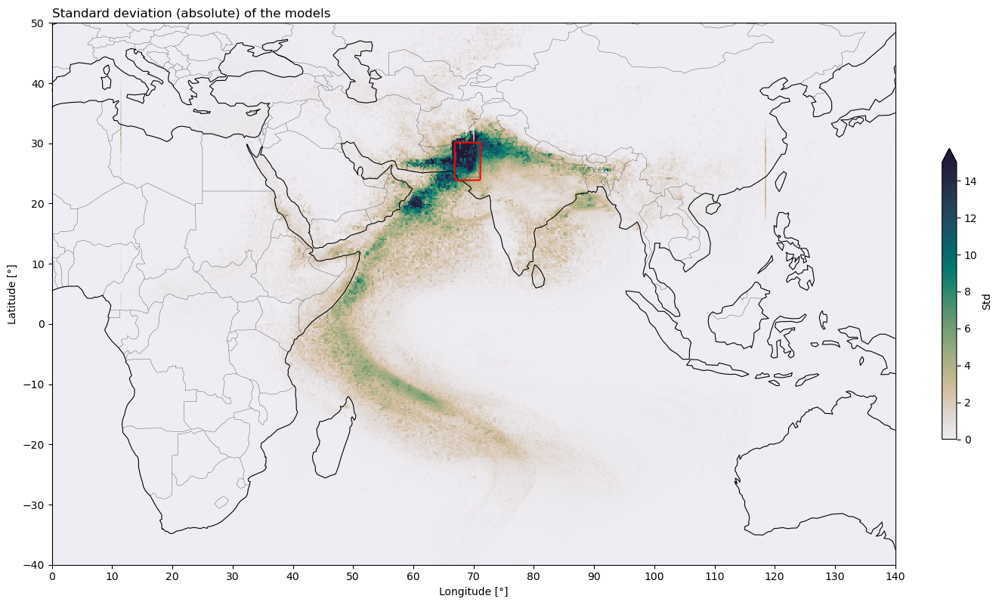

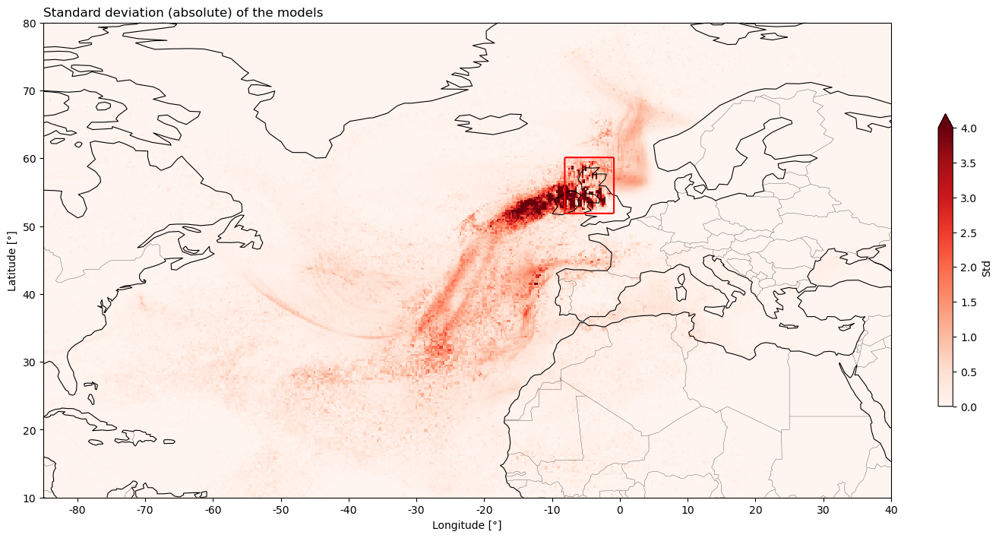

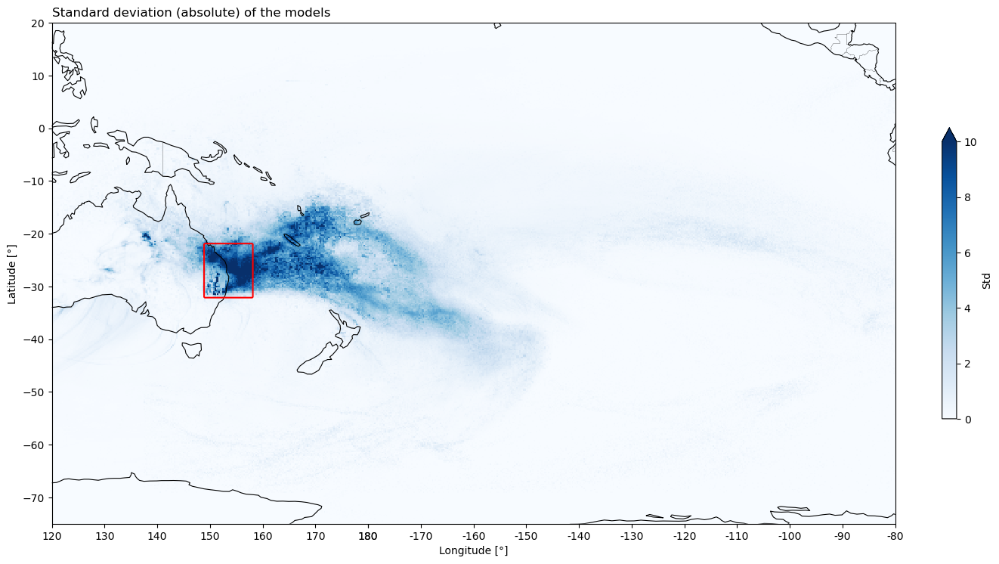

In [7]:
def std_plot(mask, path_to_data, case):
    """
    Plot the standard deviation of the different methods for a given case
    mask: the mask of your case
    path_to_data: path where you can find the data 
    case: the case you want to plot (Australia, Pakistan or Scotland)
    """
    # Read data
    all_maps = read_data(path_to_data, case)  
    
    # Define case-specific parameters
    case_params = {
        "Pakistan": {"xlim": [0, 140], "ylim": [-40, 50], "vmax": 15, "cbar": cm.rain},
        "Scotland": {"xlim": [-85, 40], "ylim": [10, 80], "vmax": 4, "cbar": "Reds"},
        "Australia": {"xlim": [120, 280], "ylim": [-75, 20], "vmax": 10, "cbar": "Blues"}
    }
    
    if case not in case_params:
        raise ValueError(f"Unknown case: {case}")
    
    params = case_params[case]
    if case == "Australia":
        # Adjust longitude from -180 to 180 range to 0 to 360
        all_maps.coords["lon"] = (all_maps.coords["lon"] + 360) % 360
        all_maps = all_maps.sortby(all_maps.lon)
    
    
    # Stack the data variables into a new dimension for computation
    stacked_data = all_maps.to_array(dim="variable")
    # Compute the standard deviation across the 'variable' dimension
    std_data = stacked_data.std(dim="variable")
    
    # Make figure of standard deviation between the different cases
    central_projection = crs.PlateCarree(central_longitude=0)
    my_projection = crs.PlateCarree(central_longitude=180) if case == "Australia" else central_projection
    fig = plt.figure(figsize=(16, 10))
    ax = fig.add_subplot(111, projection=my_projection)
    lon_formatter = LongitudeFormatter(direction_label=False, degree_symbol='')
    ax.xaxis.set_major_formatter(lon_formatter)
    std_data.plot(
        vmin=0,
        vmax=params["vmax"],
        robust=False,
        cmap=params["cbar"],
        cbar_kwargs=dict(fraction=0.05, shrink=0.5, label = "Std"), 
        transform=central_projection
    )
    
    # Add the mask
    ax.contour(mask["lon"], mask["lat"], mask.mask, levels=[0.5], colors="r", linewidths=1.5, transform=central_projection)
    
    ax.set_title("Standard deviation (absolute) of the models", loc="left")
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
    ax.add_feature(cfeature.BORDERS, linestyle="-", linewidth=0.2)

    ax.set_xticks(np.arange(-180, 181, 10), crs=central_projection)
    ax.set_yticks(np.arange(-90, 91, 10), crs=central_projection)
    ax.set_extent([params["xlim"][0], params["xlim"][1], params["ylim"][0], params["ylim"][1]], crs=central_projection)
    ax.set_xlabel("Longitude [°]")
    ax.set_ylabel("Latitude [°]")
    # Save the figure (optional)
    plt.savefig(path_to_data + "Figures/Absolute_std_" + case + ".png", dpi = 300)

    return fig, ax


std_plot(pakistan_mask, path_to_data, "Pakistan")
std_plot(scotland_mask, path_to_data, "Scotland")
std_plot(australia_mask, path_to_data, "Australia")


Loading wam2layers data for Pakistan
Loading 2ldrm data for Pakistan
Loading utrack data for Pakistan
Loading btrims data for Pakistan
Loading tracmass data for Pakistan
Loading ughent data for Pakistan
Loading UIB data for Pakistan
Loading UniVie data for Pakistan
Loading CHc data for Pakistan
Loading xu data for Pakistan
Loading tatfancheng data for Pakistan
Loading uvigo data for Pakistan
Loading wam2layers data for Australia
Loading 2ldrm data for Australia
Loading utrack data for Australia
Loading btrims data for Australia
Loading tracmass data for Australia
Loading ughent data for Australia
Loading UIB data for Australia
Loading UniVie data for Australia
Loading CHc data for Australia
Loading xu data for Australia
Loading tatfancheng data for Australia
Loading uvigo data for Australia
Loading wam2layers data for Scotland
Loading 2ldrm data for Scotland
Loading utrack data for Scotland
Loading btrims data for Scotland
Loading tracmass data for Scotland
Loading ughent data for Scot

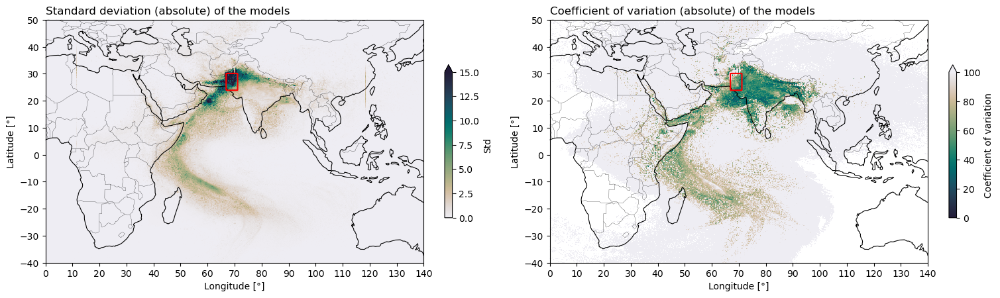

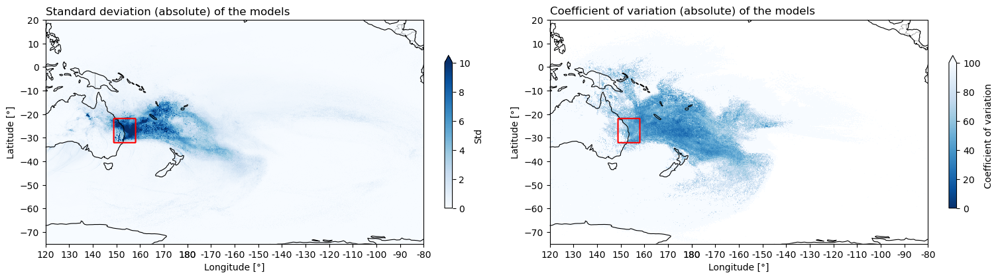

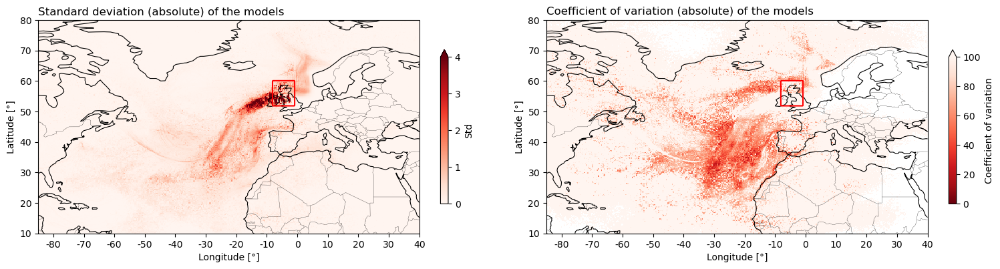

In [8]:
##% Function to plot the (absolute) std + CV (coefficient of variation) figure 
#from matplotlib.colors import ListedColormap

def std_cv_plot(mask, path_to_data, case):
    """
    Plot the standard deviation (std) and coefficient of variation (CV) of the different methods for one of the cases
    mask: the mask of your case
    path_to_data: path where you can find the data 
    case: the case you want to plot (Australia, Pakistan or Scotland)
    """
    # Read data
    all_maps = read_data(path_to_data, case)  
    
    # Define case-specific parameters
    case_params = {
        "Pakistan": {"xlim": [0, 140], "ylim": [-40, 50], "vmax_list": [15, 100], "cbar": cm.rain},
        "Scotland": {"xlim": [-85, 40], "ylim": [10, 80], "vmax_list": [4, 100], "cbar": "Reds"},
        "Australia": {"xlim": [120, 280], "ylim": [-75, 20], "vmax_list": [10, 100], "cbar": "Blues"}
    }
    
    if case not in case_params:
        raise ValueError(f"Unknown case: {case}")
    
    params = case_params[case]
    
    if case == "Australia":
        # Adjust longitude from -180 to 180 range to 0 to 360
        all_maps.coords["lon"] = (all_maps.coords["lon"] + 360) % 360
        all_maps = all_maps.sortby(all_maps.lon)

    # Stack the data variables into a new dimension for computation
    stacked_data = all_maps.to_array(dim="variable")
    # Compute the standard deviation across the 'variable' dimension
    std_data = stacked_data.std(dim="variable")
    
    # Compute the mean across the 'variable' dimension
    mean_data = stacked_data.mean(dim="variable")
    #OPTION 1: if you just use a mean data threshold (this is because if there's e.g. one model giving at a grid point a very small amount of mm, 
    #then the CV gets really big
    #mean_data = mean_data.where(mean_data >= 0.05, np.nan) 
    
    #OPTION 2: if more than half of the models have 0mm, then don't include it
    # Count the number of variables with value 0 at each (lat, lon) location + create mask
    zero_count = (stacked_data == 0).sum(dim="variable")
    zero_mask = zero_count >= 6
    # Apply the zero mask to mean_data, replacing those values with NaN
    mean_data = mean_data.where(~zero_mask, np.nan)
    
    # Compute the std/mean (coefficient of variation)
    CV_data = (std_data/mean_data)*100
    
    # Make figure of standard deviation and CV between the different cases
    central_projection = crs.PlateCarree(central_longitude=0)
    my_projection = crs.PlateCarree(central_longitude=180) if case == "Australia" else central_projection
    fig, axs = plt.subplots(1, 2, figsize=(18, 6), subplot_kw={"projection":my_projection}, sharey=False)
    
    data_list = [std_data, CV_data]
    titles = ["Standard deviation (absolute) of the models", "Coefficient of variation (absolute) of the models"]
    cbar_label = ["Std", "Coefficient of variation"]
    
    for ax, data, title, vmax, cbar_label in zip(axs, data_list, titles, params["vmax_list"], cbar_label):
        data.plot(
            vmin=0,
            vmax=vmax,
            robust=False,
            cmap=params["cbar"], #if cbar_label == "Std" else plt.get_cmap(params["cbar"]).reversed(),
            cbar_kwargs=dict(fraction=0.05, shrink=0.5, label = cbar_label),
            ax=ax,
            transform=central_projection
        )
        lon_formatter = LongitudeFormatter(direction_label=False, degree_symbol='')
        ax.xaxis.set_major_formatter(lon_formatter)
        ax.contour(mask["lon"], mask["lat"], mask.mask, levels=[0.5], colors="r", linewidths=1.5, transform=central_projection) # plot the mask
        ax.set_title(title, loc="left")
        ax.add_feature(cartopy.feature.COASTLINE, linewidth=0.8)
        ax.add_feature(cartopy.feature.BORDERS, linestyle='-', linewidth=0.2)
        ax.set_xticks(np.arange(-180, 181, 10), crs=central_projection)
        ax.set_yticks(np.arange(-90, 91, 10), crs=central_projection)
        ax.set_extent([params["xlim"][0], params["xlim"][1], params["ylim"][0], params["ylim"][1]], crs=central_projection)
        ax.set_xlabel("Longitude [°]")
        ax.set_ylabel("Latitude [°]")
    
    plt.savefig(path_to_data + "Figures/Absolute_std_and_CV_" + case + ".png", dpi=300)
std_cv_plot(pakistan_mask, path_to_data, "Pakistan")
std_cv_plot(australia_mask, path_to_data, "Australia")
std_cv_plot(scotland_mask, path_to_data, "Scotland")

Loading wam2layers data for Pakistan
Loading 2ldrm data for Pakistan
Loading utrack data for Pakistan
Loading btrims data for Pakistan
Loading tracmass data for Pakistan
Loading ughent data for Pakistan
Loading UIB data for Pakistan
Loading UniVie data for Pakistan
Loading CHc data for Pakistan
Loading xu data for Pakistan
Loading tatfancheng data for Pakistan
Loading uvigo data for Pakistan
Loading wam2layers data for Australia
Loading 2ldrm data for Australia
Loading utrack data for Australia
Loading btrims data for Australia
Loading tracmass data for Australia
Loading ughent data for Australia
Loading UIB data for Australia
Loading UniVie data for Australia
Loading CHc data for Australia
Loading xu data for Australia
Loading tatfancheng data for Australia
Loading uvigo data for Australia
Loading wam2layers data for Scotland
Loading 2ldrm data for Scotland
Loading utrack data for Scotland
Loading btrims data for Scotland
Loading tracmass data for Scotland
Loading ughent data for Scot

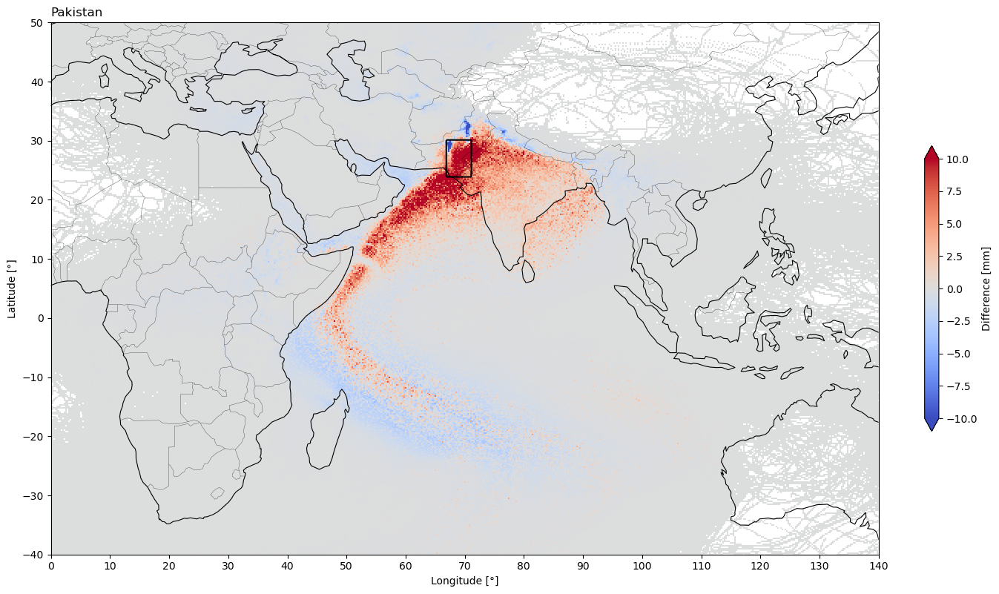

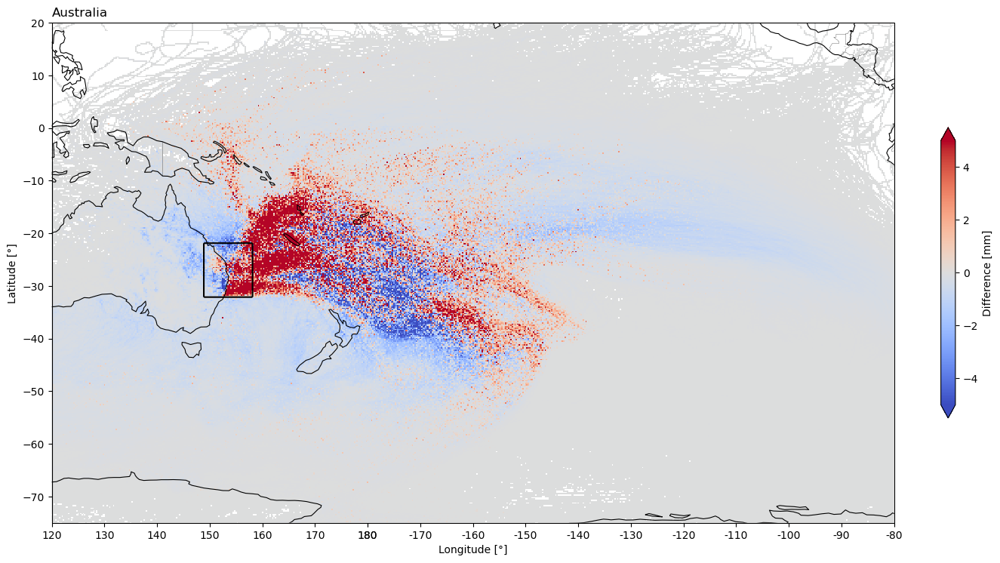

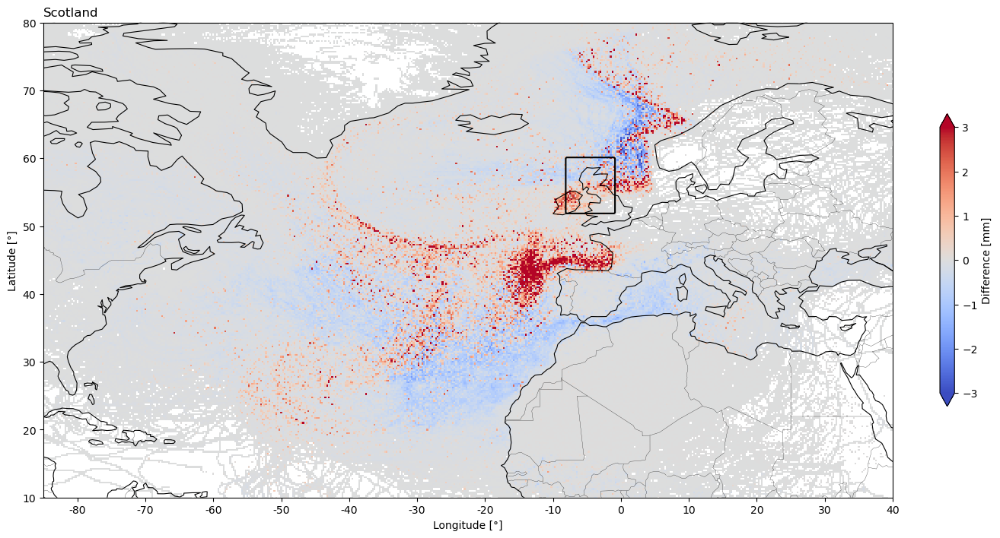

In [8]:
# Function to plot and show the absolute model difference between two models
def plot_difference(mask, path_to_data, case, model1, model2, vmax):
    """
    Calculate the absoulte difference between 2 methods
    mask: the mask of your case
    path_to_data: path where you can find the data 
    case: the case you want to plot (Australia, Pakistan or Scotland)
    model1 and model2: the 2 methods you want to compare
    vmax: max value of your colourbar 
    """
    # Read the data
    all_maps = read_data(path_to_data, case) 
    # Define case-specific parameters
    case_params = {
        "Pakistan": {"xlim": [0, 140], "ylim": [-40, 50]},
        "Scotland": {"xlim": [-85, 40], "ylim": [10, 80]},
        "Australia": {"xlim": [120, 280], "ylim": [-75, 20]}
    }
    
    if case not in case_params:
        raise ValueError(f"Unknown case: {case}")
    
    params = case_params[case]
    if case == "Australia":
        # Adjust longitude from -180 to 180 range to 0 to 360
        all_maps.coords["lon"] = (all_maps.coords["lon"] + 360) % 360
        all_maps = all_maps.sortby(all_maps.lon)
    
    # Select the 2 methods to compare
    dataset1 = all_maps[model1]
    dataset2 = all_maps[model2]
    # Calculate the absolute difference between the 2 methods
    diff = dataset1 - dataset2
    diff = diff.where(diff != 0, np.nan)
        
    # Make figure
    central_projection = crs.PlateCarree(central_longitude=0)
    my_projection = crs.PlateCarree(central_longitude=180) if case == "Australia" else central_projection
    fig = plt.figure(figsize=(16, 10))
    ax = fig.add_subplot(111, projection=my_projection)
    lon_formatter = LongitudeFormatter(direction_label=False, degree_symbol='')
    ax.xaxis.set_major_formatter(lon_formatter)
    diff.plot(vmin=-1*vmax, vmax=vmax, robust=False, cmap="coolwarm", cbar_kwargs=dict(fraction=0.05, shrink=0.5, label = "Difference [mm]"), transform = central_projection)  
    
    ax.add_feature(cartopy.feature.COASTLINE, linewidth=0.8)
    ax.add_feature(cartopy.feature.BORDERS, linestyle="-", linewidth=.2)
    ax.set_title(case, loc="left")
    ax.set_xticks(np.arange(-180, 181, 10), crs=central_projection)
    ax.set_yticks(np.arange(-90, 91, 10), crs=central_projection)
    ax.set_extent([params["xlim"][0], params["xlim"][1], params["ylim"][0], params["ylim"][1]], crs=central_projection)
    ax.set_xlabel("Longitude [°]")
    ax.set_ylabel("Latitude [°]")    
    # Add mask
    ax.contour(mask["lon"], mask["lat"], mask.mask, levels=[0.5], colors="k", linewidths=1.5, transform=central_projection)    
    # plt.savefig(path_to_data + "Figures/Absolute_difference_" + case + "_" + model1 + "_" + model2 + ".png", dpi = 300)
    return fig, ax, diff

_,_,diff=plot_difference(pakistan_mask, path_to_data, "Pakistan", "FLEXPART-HAMSTER Ens4", "UTrack Ens1", vmax=10)
_,_,diff=plot_difference(australia_mask, path_to_data, "Australia", "FLEXPART-HAMSTER Ens4", "UTrack Ens1", vmax=5)
_,_,diff=plot_difference(scotland_mask, path_to_data, "Scotland", "FLEXPART-HAMSTER Ens4", "UTrack Ens1", vmax=3)

Loading wam2layers data for Pakistan
Loading 2ldrm data for Pakistan
Loading utrack data for Pakistan
Loading btrims data for Pakistan
Loading tracmass data for Pakistan
Loading ughent data for Pakistan
Loading UIB data for Pakistan
Loading UniVie data for Pakistan
Loading CHc data for Pakistan
Loading xu data for Pakistan
Loading tatfancheng data for Pakistan
Loading uvigo data for Pakistan
Loading wam2layers data for Australia
Loading 2ldrm data for Australia
Loading utrack data for Australia
Loading btrims data for Australia
Loading tracmass data for Australia
Loading ughent data for Australia
Loading UIB data for Australia
Loading UniVie data for Australia
Loading CHc data for Australia
Loading xu data for Australia
Loading tatfancheng data for Australia
Loading uvigo data for Australia
Loading wam2layers data for Scotland
Loading 2ldrm data for Scotland
Loading utrack data for Scotland
Loading btrims data for Scotland
Loading tracmass data for Scotland
Loading ughent data for Scot

(<Figure size 2400x600 with 6 Axes>,
 array([<GeoAxes: title={'left': 'Pakistan'}, xlabel='Longitude [°]', ylabel='Latitude [°]'>,
        <GeoAxes: title={'left': 'Australia'}, xlabel='Longitude [°]', ylabel='Latitude [°]'>,
        <GeoAxes: title={'left': 'Scotland'}, xlabel='Longitude [°]', ylabel='Latitude [°]'>],
       dtype=object))

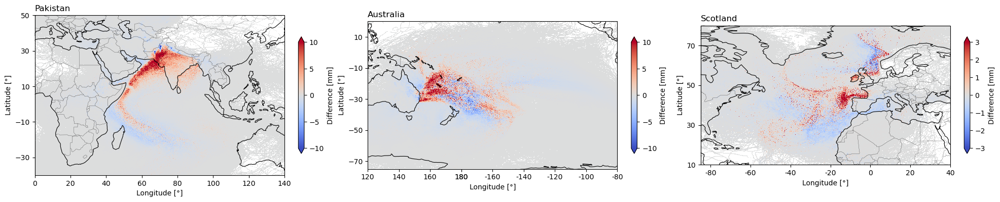

In [9]:
#To compare two models (show the absolute difference between two models) for all the cases (so with subplots)
def plot_difference(path_to_data, model1, model2):
    """
    Calculate the absoulte difference between 2 methods for all three cases in one plot
    path_to_data: path where you can find the data 
    model1 and model2: the 2 methods you want to compare
    """    
    central_projection = crs.PlateCarree(central_longitude=0)
    fig, axs = plt.subplots(1, 3, figsize=(24, 6), subplot_kw={"projection": crs.PlateCarree()}, sharey=False)
    cases = ["Pakistan", "Australia", "Scotland"]
    for i, case in enumerate(cases):
        all_maps = read_data(path_to_data, case)
        # Define case-specific parameters
        case_params = {
            "Pakistan": {"xlim": [0, 140], "ylim": [-40, 50], "vmax": 10},
            "Scotland": {"xlim": [-85, 40], "ylim": [10, 80], "vmax": 3},
            "Australia": {"xlim": [120, 280], "ylim": [-75, 20], "vmax": 5}
        }
    
        if case not in case_params:
            raise ValueError(f"Unknown case: {case}")
    
        params = case_params[case]
        if case == "Australia":
            # Adjust longitude from -180 to 180 range to 0 to 360
            all_maps.coords["lon"] = (all_maps.coords["lon"] + 360) % 360
            all_maps = all_maps.sortby(all_maps.lon)
        
        my_projection = crs.PlateCarree(central_longitude=180) if case == "Australia" else central_projection
        axs[i].projection = my_projection
        diff = all_maps[model1] - all_maps[model2]
        diff = diff.where(diff != 0, np.nan)
        diff.plot(vmin=-1*params["vmax"], vmax=params["vmax"], robust=False, cmap="coolwarm", cbar_kwargs=dict(fraction=0.05, shrink=0.5, label = "Difference [mm]"), 
        ax=axs[i],transform = central_projection,)
        lon_formatter = LongitudeFormatter(direction_label=False, degree_symbol='')
        axs[i].xaxis.set_major_formatter(lon_formatter)
        axs[i].set_title(case, loc="left")
        axs[i].add_feature(cartopy.feature.COASTLINE, linewidth=0.8)
        axs[i].add_feature(cartopy.feature.BORDERS, linestyle="-", linewidth=.2)
        axs[i].set_xticks(np.arange(-180, 181, 20), crs=central_projection)
        axs[i].set_yticks(np.arange(-90, 91, 20), crs=central_projection)
        axs[i].set_extent([params["xlim"][0], params["xlim"][1], params["ylim"][0], params["ylim"][1]], crs=central_projection)
        axs[i].set_xlabel("Longitude [°]")
        axs[i].set_ylabel("Latitude [°]")

        # plt.savefig(path_to_data + "Figures/Absolute_difference_" + model1 + "_" + model2 + ".png", dpi = 300)
    return fig, axs

plot_difference(path_to_data, "FLEXPART-HAMSTER Ens4", "UTrack Ens1")

Loading wam2layers data for Pakistan
Loading 2ldrm data for Pakistan
Loading utrack data for Pakistan
Loading btrims data for Pakistan
Loading tracmass data for Pakistan
Loading ughent data for Pakistan
Loading UIB data for Pakistan
Loading UniVie data for Pakistan
Loading CHc data for Pakistan
Loading xu data for Pakistan
Loading tatfancheng data for Pakistan
Loading uvigo data for Pakistan
Loading wam2layers data for Australia
Loading 2ldrm data for Australia
Loading utrack data for Australia
Loading btrims data for Australia
Loading tracmass data for Australia
Loading ughent data for Australia
Loading UIB data for Australia
Loading UniVie data for Australia
Loading CHc data for Australia
Loading xu data for Australia
Loading tatfancheng data for Australia
Loading uvigo data for Australia
Loading wam2layers data for Scotland
Loading 2ldrm data for Scotland
Loading utrack data for Scotland
Loading btrims data for Scotland
Loading tracmass data for Scotland
Loading ughent data for Scot

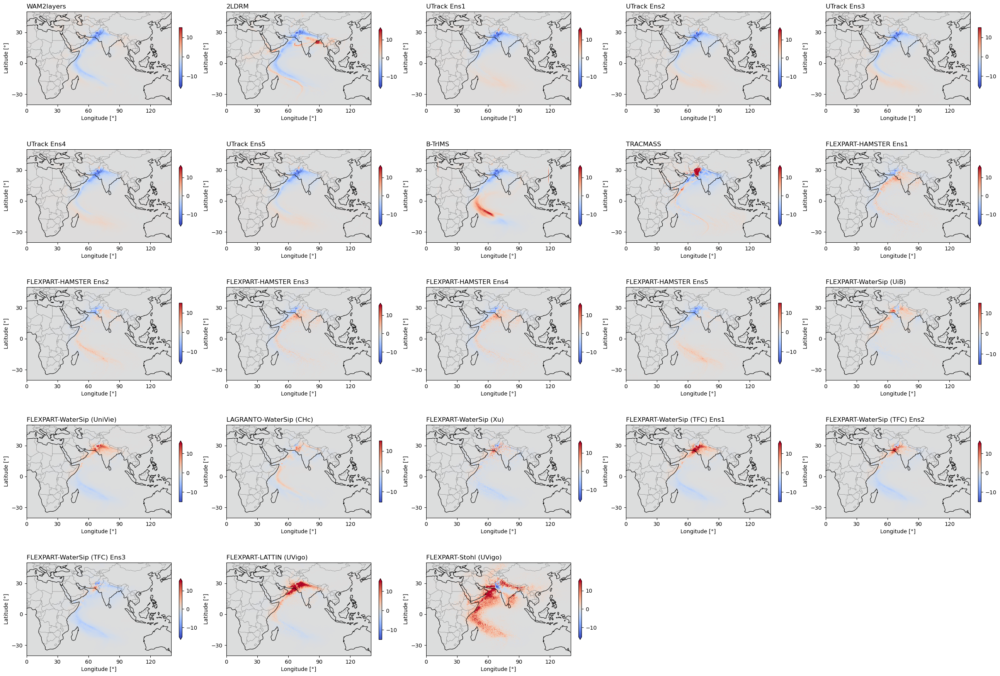

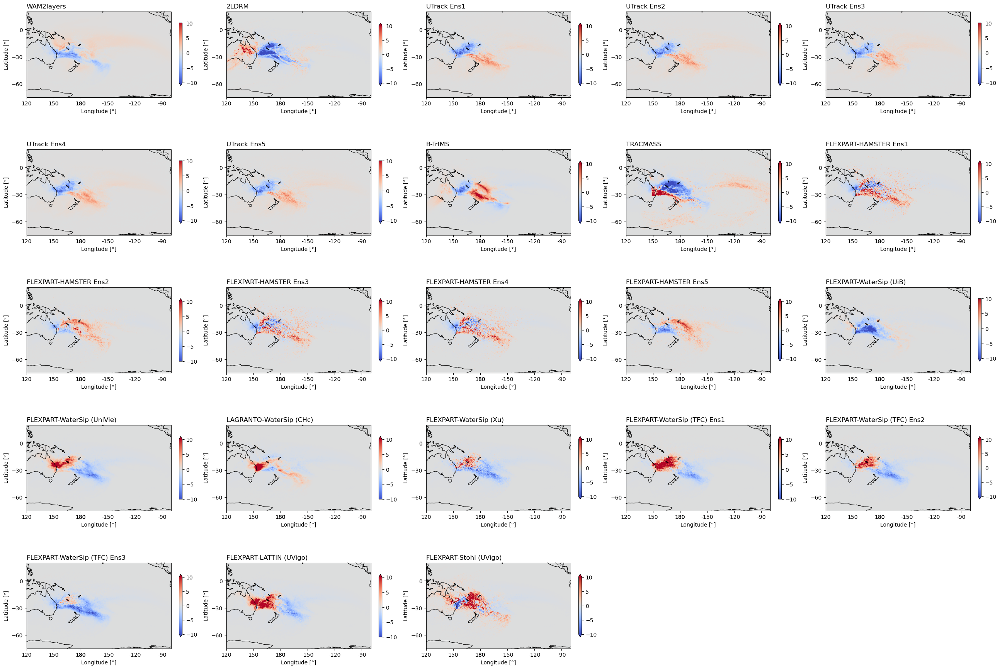

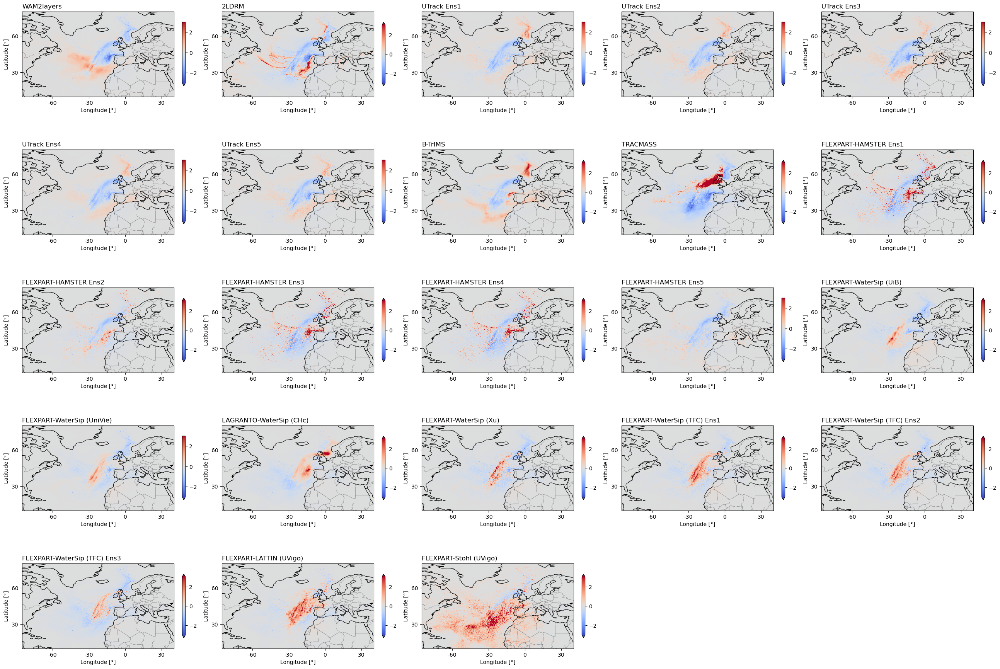

In [10]:
# Function to plot for all of the methods the difference from the mean (mean over the different methods)
def diff_from_mean_plot(mask, path_to_data, case, figsize=[26,18]):
    """
    Calculate the absoulte difference from the mean for all methods
    mask: the mask of your case
    path_to_data: path where you can find the data 
    case: the case you want to plot (Australia, Pakistan or Scotland)
    figsize: size of the figure
    """    
    # Read data
    all_maps = read_data(path_to_data, case)
    model_names = list(all_maps.keys())
    # Define case-specific parameters
    case_params = {
        "Pakistan": {"xlim": [0, 140], "ylim": [-40, 50], "vmax": 15},
        "Scotland": {"xlim": [-85, 40], "ylim": [10, 80], "vmax": 3},
        "Australia": {"xlim": [120, 280], "ylim": [-75, 20], "vmax": 10}
    }
    
    if case not in case_params:
        raise ValueError(f"Unknown case: {case}")
    
    params = case_params[case]
    if case == "Australia":
        # Adjust longitude from -180 to 180 range to 0 to 360
        all_maps.coords["lon"] = (all_maps.coords["lon"] + 360) % 360
        all_maps = all_maps.sortby(all_maps.lon)
    
    # Stack the data variables into a new dimension for computation
    stacked_data = all_maps.to_array(dim="variable")
    nr_var = len(stacked_data["variable"])  # number of models
    stacked_data = stacked_data.fillna(0)
    # Calculate the mean over all models
    mean_data = stacked_data.mean(dim="variable")
    # Calculate the difference from the mean
    mean_diff = stacked_data - mean_data
    
    # Make the figure
    central_projection = crs.PlateCarree(central_longitude=0)
    my_projection = crs.PlateCarree(central_longitude=180) if case == "Australia" else central_projection
    fig, axs = plt.subplots(5, 5, figsize=(figsize[0],figsize[1]), subplot_kw={"projection": my_projection}, sharey=False)
    axs=axs.flatten()
    lon_formatter = LongitudeFormatter(direction_label=False, degree_symbol='')

    for i,ax in enumerate(axs):
        if i < nr_var:
            mean_diff[i].plot(vmin=-1*params["vmax"], vmax=params["vmax"], robust=False, cmap="coolwarm", cbar_kwargs=dict(fraction=0.05, shrink=0.5), ax=ax, transform = central_projection)
            ax.xaxis.set_major_formatter(lon_formatter)
            ax.set_title("") 
            ax.set_title(model_names[i], loc="left")
            ax.add_feature(cartopy.feature.COASTLINE, linewidth=0.8)
            ax.add_feature(cartopy.feature.BORDERS, linestyle="-", linewidth=.2)
            ax.set_xticks(np.arange(-180, 181, 30), crs=central_projection)
            ax.set_yticks(np.arange(-90, 91, 30), crs=central_projection)
            ax.set_extent([params["xlim"][0], params["xlim"][1], params["ylim"][0], params["ylim"][1]], crs=central_projection)
            ax.set_xlabel("Longitude [°]")
            ax.set_ylabel("Latitude [°]")
            #ax.contour(mask["lon"], mask["lat"], mask.mask, levels=[0.5], colors="k", linewidths=1.5, transform=central_projection)    
        else:
            ax.set_visible(False)
    
    plt.tight_layout()
    plt.savefig(path_to_data + "Figures/Difference_from_mean_allmethods_" + case + ".png", dpi = 300)

diff_from_mean_plot(pakistan_mask, path_to_data, "Pakistan")
diff_from_mean_plot(australia_mask, path_to_data, "Australia") 
diff_from_mean_plot(scotland_mask, path_to_data, "Scotland")     